In [1]:
import pandas as pd
import nltk
from nltk.tokenize import sent_tokenize
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity

# Path to the CSV file
csv_file = r"E:\TCGA_Reports.csv"

# Initialize NLTK
nltk.download('punkt')

# Function to calculate cosine similarity
def calculate_cosine_similarity(reference_summary, text):
    sentences = sent_tokenize(text)
    vectorizer = CountVectorizer().fit_transform([reference_summary] + sentences)
    vectors = vectorizer.toarray()
    cosine_similarities = cosine_similarity(vectors[0:1], vectors[1:]).flatten()
    return sentences[cosine_similarities.argmax()]

# Read the CSV file
df = pd.read_csv(csv_file)

# Reference summary (if available)
reference_summary = "This is a reference summary."

# Initialize a list to store summaries
summaries = []

# Iterate over rows and calculate summaries
for idx, row in df.iterrows():
    text = row['text']
    summary = calculate_cosine_similarity(reference_summary, text)
    summaries.append(summary)

# Display the summaries
for idx, summary in enumerate(summaries, start=1):
    print(f"Summary {idx}: {summary}")


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\yache\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Summary 1: A photograph Is taken.
Summary 2: Material: 1) Material: stomach, Method of collection: Lesion resection.
Summary 3: is 3 cm.
Summary 4: Microscopic Description: Epidermis is necrotic, ulcerated.
Summary 5: No appendix is present.
Summary 6: No cervix is.
Summary 7: By this signature, I attest that the above diagnosis is based upon my.
Summary 8: THERE IS NO EVIDENCE OF MALIGNANCY.
Summary 9: This pattern of staining is indicative of a. adenocarcinoma.
Summary 10: This modified report is being issued to provide additional information/results.
Summary 11: This test is used for clinical.
Summary 12: Diagnosis.
Summary 13: - Accessory spleen is identified, 0.5x0.4cm in size.
Summary 14: STOMACH TISSUE CHECKLIST.
Summary 15: the mass is inked blue.
Summary 16: This Laboratory is.
Summary 17: This focus is inked and the specimen is sectioned to show a.
Summary 18: There is mild endothelial.
Summary 19: is.
Summary 20: FINAL DIAGNUSIS: PART 1: LYMPH NODE, RIGHT LEVEL 10, BIOPSY -.

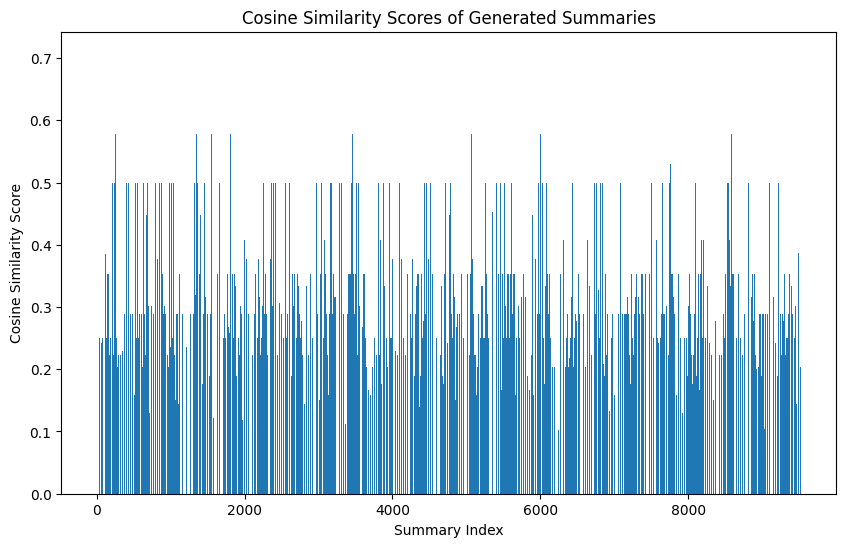

In [22]:
import matplotlib.pyplot as plt

# Calculate cosine similarity scores
cosine_similarity_scores = []
for text in df['text']:
    summary = calculate_cosine_similarity(reference_summary, text)
    vectorizer = CountVectorizer().fit_transform([reference_summary, summary])
    vectors = vectorizer.toarray()
    cosine_similarity_scores.append(cosine_similarity(vectors)[0,1])

# Plot the cosine similarity scores
plt.figure(figsize=(10, 6))
plt.bar(range(len(cosine_similarity_scores)), cosine_similarity_scores)
plt.xlabel('Summary Index')
plt.ylabel('Cosine Similarity Score')
plt.title('Cosine Similarity Scores of Generated Summaries')
plt.show()


In [25]:
import pandas as pd
import nltk
from nltk.tokenize import sent_tokenize
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from rouge import Rouge
from nltk.translate.bleu_score import sentence_bleu

# Path to the CSV file
csv_file = r"E:\TCGA_Reports.csv"

# Initialize NLTK
nltk.download('punkt')

# Function to calculate cosine similarity
def calculate_cosine_similarity(reference_summary, text):
    sentences = sent_tokenize(text)
    vectorizer = CountVectorizer().fit_transform([reference_summary] + sentences)
    vectors = vectorizer.toarray()
    cosine_similarities = cosine_similarity(vectors[0:1], vectors[1:]).flatten()
    return sentences[cosine_similarities.argmax()]

# Function to calculate BLEU score
def calculate_bleu_score(reference_summary, generated_summary):
    reference = reference_summary.split()
    generated = generated_summary.split()
    return sentence_bleu([reference], generated)

# Read the CSV file
df = pd.read_csv(csv_file)

# Reference summary (if available)
reference_summary = "This is a reference summary."

# Initialize lists to store summaries
summaries = []

# Initialize Rouge
rouge = Rouge()

# Initialize lists to store scores
cosine_similarity_scores = []
rouge_scores = []
bleu_scores = []

# Iterate over rows and calculate summaries and scores
for idx, row in df.iterrows():
    text = row['text']
    summary = calculate_cosine_similarity(reference_summary, text)
    summaries.append(summary)
    
    # Calculate cosine similarity score
    cosine_similarity_scores.append(calculate_cosine_similarity(reference_summary, text))
    
    # Calculate ROUGE score
    rouge_scores.append(rouge.get_scores(summary, reference_summary)[0]['rouge-1']['f'])
    
    # Calculate BLEU score
    bleu_scores.append(calculate_bleu_score(reference_summary, summary))

# Display the summaries and scores
for idx, summary in enumerate(summaries, start=1):
    print(f"Summary {idx}: {summary}")
    print(f"Cosine Similarity Score: {cosine_similarity_scores[idx - 1]}")
    print(f"ROUGE Score: {rouge_scores[idx - 1]}")
    print(f"BLEU Score: {bleu_scores[idx - 1]}")
    print()

# Calculate average scores
avg_cosine_similarity = sum(cosine_similarity_scores) / len(cosine_similarity_scores)
avg_rouge = sum(rouge_scores) / len(rouge_scores)
avg_bleu = sum(bleu_scores) / len(bleu_scores)

print(f"Average Cosine Similarity Score: {avg_cosine_similarity}")
print(f"Average ROUGE Score: {avg_rouge}")
print(f"Average BLEU Score: {avg_bleu}")


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\yache\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
c:\Users\yache\AppData\Local\Programs\Python\Python311\Lib\site-packages\nltk\translate\bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
c:\Users\yache\AppData\Local\Programs\Python\Python311\Lib\site-packages\nltk\translate\bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
c:\Users\yache\AppData\Local\Programs\Python\Python311\Lib\site-packages\nltk\translate\bleu_score.py:552: UserW

Summary 1: A photograph Is taken.
Cosine Similarity Score: A photograph Is taken.
ROUGE Score: 0.0
BLEU Score: 0

Summary 2: Material: 1) Material: stomach, Method of collection: Lesion resection.
Cosine Similarity Score: Material: 1) Material: stomach, Method of collection: Lesion resection.
ROUGE Score: 0.0
BLEU Score: 0

Summary 3: is 3 cm.
Cosine Similarity Score: is 3 cm.
ROUGE Score: 0.24999999531250006
BLEU Score: 7.107197028258987e-232

Summary 4: Microscopic Description: Epidermis is necrotic, ulcerated.
Cosine Similarity Score: Microscopic Description: Epidermis is necrotic, ulcerated.
ROUGE Score: 0.18181817685950424
BLEU Score: 1.1640469867513693e-231

Summary 5: No appendix is present.
Cosine Similarity Score: No appendix is present.
ROUGE Score: 0.22222221728395072
BLEU Score: 1.0032743411283238e-231

Summary 6: No cervix is.
Cosine Similarity Score: No cervix is.
ROUGE Score: 0.24999999531250006
BLEU Score: 0

Summary 7: By this signature, I attest that the above diagnos

TypeError: unsupported operand type(s) for +: 'int' and 'str'

In [4]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Load the dataset
df = pd.read_csv(r"E:\TCGA_Reports.csv")

# Preprocess the data
tokenizer = Tokenizer()
tokenizer.fit_on_texts(df['text'])

X = tokenizer.texts_to_sequences(df['text'])

# Determine the max length of sequences
max_len = max(len(seq) for seq in X)

# Pad sequences to ensure uniform length
X = pad_sequences(X, maxlen=max_len, padding='post')

# Define the CNN model
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(input_dim=len(tokenizer.word_index)+1, output_dim=100),
    tf.keras.layers.Conv1D(128, 5, activation='relu'),
    tf.keras.layers.GlobalMaxPooling1D(),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train-test split
X_train, X_test = train_test_split(X, test_size=0.2, random_state=42)

# Define labels (assuming binary classification)
# Replace this with your actual label data
y_train = np.random.randint(2, size=(X_train.shape[0],))
y_test = np.random.randint(2, size=(X_test.shape[0],))

# Train the model
model.fit(X_train, y_train, epochs=5, batch_size=32, validation_split=0.1)

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Test Accuracy: {accuracy}')




Epoch 1/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 124s 546ms/step - accuracy: 0.4987 - loss: 0.6941 - val_accuracy: 0.4843 - val_loss: 0.6953
Epoch 2/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 114s 531ms/step - accuracy: 0.6745 - loss: 0.6679 - val_accuracy: 0.5013 - val_loss: 0.6992
Epoch 3/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 111s 517ms/step - accuracy: 0.7960 - loss: 0.6074 - val_accuracy: 0.4856 - val_loss: 0.7218
Epoch 4/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 114s 531ms/step - accuracy: 0.8932 - loss: 0.4672 - val_accuracy: 0.4974 - val_loss: 0.7570
Epoch 5/5
215/215 ━━━━━━━━━━━━━━━━━━━━ 133s 619ms/step - accuracy: 0.9673 - loss: 0.2640 - val_accuracy: 0.4934 - val_loss: 0.8171
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step - accuracy: 0.4972 - loss: 0.8027
Test Accuracy: 0.500262439250946


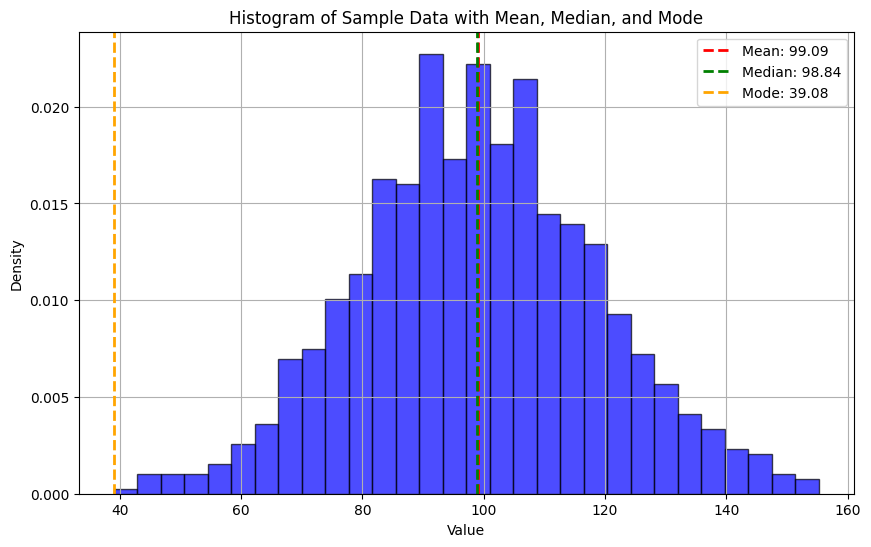

In [8]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# Generate sample data
np.random.seed(0)
data = np.random.normal(loc=100, scale=20, size=1000)  # Generate 1000 random numbers with mean=100 and std=20

# Calculate mean, median, and mode
mean = np.mean(data)
median = np.median(data)
mode = float(stats.mode(data)[0])  # Mode returns an array, so we take the first element

# Plot histogram
plt.figure(figsize=(10, 6))
plt.hist(data, bins=30, alpha=0.7, color='blue', edgecolor='black', density=True)
plt.axvline(mean, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean:.2f}')
plt.axvline(median, color='green', linestyle='dashed', linewidth=2, label=f'Median: {median:.2f}')
plt.axvline(mode, color='orange', linestyle='dashed', linewidth=2, label=f'Mode: {mode:.2f}')
plt.xlabel('Value')
plt.ylabel('Density')
plt.title('Histogram of Sample Data with Mean, Median, and Mode')
plt.legend()
plt.grid(True)
plt.show()


In [2]:
import pandas as pd
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity

# Load the dataset
df = pd.read_csv(r"E:\TCGA_Reports.csv")

# Tokenize the text into sentences
df['sentences'] = df['text'].apply(sent_tokenize)

# Tokenize the text into words
df['words'] = df['text'].apply(word_tokenize)

# Create a Bag of Words representation
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(df['text'])

# Calculate pairwise cosine similarity
cosine_sim = cosine_similarity(X, X)

# Implement TextRank algorithm for text summarization
def textrank_summary(text, num_sentences=2):
    sentences = sent_tokenize(text)
    word_embeddings = vectorizer.transform(sentences)
    sentence_scores = cosine_similarity(word_embeddings, X).sum(axis=1)
    ranked_sentences = [sentence for _, sentence in sorted(zip(sentence_scores, sentences), reverse=True)[:num_sentences]]
    return ' '.join(ranked_sentences)

# Generate summaries for each text
df['summary'] = df['text'].apply(lambda x: textrank_summary(x))

# Print the summaries
for idx, summary in enumerate(df['summary']):
    print(f"Summary for text {idx+1}:")
    print(summary)
    print()


Summary for text 1:
The clearance from the resection margin is 1.1 cm. Portions of the.

Summary for text 2:
Tubular adenocarcinoma of the. Cancerous proliferation reaches the periteneal surface of the stomach.

Summary for text 3:
lumen, is located 14.5 cm away from one of the excision lines and 4.3 cm from the other one. Macroscopic description: A 26 cm length of the large intestine with a piece of mesentery and periintestinal tissue sized 20 X 11.7 cm.

Summary for text 4:
Tumor is composed of spindle or oval tumor. Lymph nodes: 2/9 positive for metastasis (Right inguinal and pelvic lymph node 2/9).

Summary for text 5:
The proximal, distal and radial margins of resection are free of. A portion of tumor and a portion of normal are.

Summary for text 6:
One nodule is adjacent to the fimbriated end of the tube,. The myometrium is 1.5 cm.

Summary for text 7:
The LOCATION (S) OF THE PRIMARY TUMOR (S) is/are: Left and right ovary. The FIGO GRADE of the tumor is: II.

Summary for text 8: